#  **Flights_Analysis_in_2015** 
Mengran Tang (December 2017)
___

In this notebook, I analyze the **flights distribution and delays** across US in 2015 for different major airlines and develop a  **LightGBM classification model** to predict flights delay situation and a **RNN-based NLP model ** for airlines sentiment analysis accoring to the Twitter.

____
From a **_technical point of view_**, the main aspects of python covered throughout the notebook are:
- **visualization**: matplolib, seaborn, plotly
- **data manipulation**: pandas, numpy
- **modeling**: keras, LightGBM
- **problem**: classification, NLP
___
This notebook involved two parts of data. First, the flight delay and cancellation data was collected and published by the DOT's Bureau of Transportation Statistics, which tracks the on-time performance of domestic flights operated by large air carriers. Second, the Twitter sentiment data came from Crowdflower's Data for Everyone library, which is scraped from February of 2015 and contributors were asked to first classify positive, negative, and neutral tweets, followed by categorizing negative reasons (such as "late flight" or "rude service")

I am using plotly for main data visualization to get beautiful pictures as well as interactivity. You can see every detail in the plotly graph. LightGBM has been proven that it is not just quick but also accurate compare to other methods such as XGBoost, so I think it is good for this classification problem. As for dealing with the Twitter, Natural language processing is needed. Because it is well known that RNN is widely used in NLP such as translate, I use keras to implement this RNN to solve this sentiment analysis problem. <br>
___

This notebook is composed of three parts: Flights data visualization (section 1), Delay Classification (section 2) and Twitter Sentiment Analysis (section 3).

** _Preamble_:** _overview of the datasets_ <br>

**1. Flights data visualization** <br>
- 1.1 Flights Overall situation in Us <br>
- 1.2 Flights Distribution  <br>
- 1.3 Canceled Flights situation <br>
- 1.4 Different Delays Correlation  <br>
- 1.5 Basic statistical description of airlines  <br>
- 1.6 Delays heatmap  <br>
- 1.7 Delays distribution  <br>

**2. Delay Classification** <br>
- 2.1 Divide Delay Type  <br>
- 2.2 Speed Analysis  <br>
- 2.3 Build and train model  <br>
- 2.4 Evaluation the model  <br>
- 2.5 Factor analysis   <br>

**3. Twitter Sentiment Analysis** <br>
- 3.1 Sentiment distribution <br>
- 3.2 Word Cloud for Positive Sentiment <br>
- 3.3 Word Cloud for Negative Sentiment <br>
- 3.4 Word Cloud for Neutral Sentiment <br>
- 3.5 Build and Train RNN Model <br>

**Conclusion**


![](http://www.slate.com/content/dam/slate/articles/technology/future_tense/2016/05/160503_FT_cybersecurity-airplanes.jpg.CROP.promo-xlarge2.jpg)
___
## _Preamble_: overview of the dataset

First, I load all the packages that will be needed during this project, and then, I read all files that contains the details of all the flights that occured in 2015. I output some informations about the flights concerning the types of the variables in the dataframe and the quantity of null values for each variable. Here, you can click the button to show the raw code.

In [1]:
import numpy as np
import pandas as pd 
import plotly.offline as py
py.offline.init_notebook_mode()
pd.options.display.max_columns = 50
import plotly.graph_objs as go
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from sklearn.metrics import classification_report
import seaborn as sns
from wordcloud import WordCloud, STOPWORDS
import lightgbm as lgb
import warnings
warnings.filterwarnings('ignore')
from sklearn.preprocessing import LabelEncoder, MinMaxScaler, StandardScaler
from sklearn.cross_validation import train_test_split
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.layers import Input, Dropout, Dense, BatchNormalization, Activation, concatenate, GRU, Embedding, Flatten
from keras.models import Model
from keras import backend as K
from IPython.display import HTML
HTML('''
<script>
  code_show=true; 
  function code_toggle() {
   if (code_show){
     $('div.input').hide();
   } else {
     $('div.input').show();
   }
   code_show = !code_show;
  } 
  $(document).ready(code_toggle);
</script>
<form action="javascript:code_toggle()">
  <input type="submit" value="Click here to toggle on/off the raw code.">
</form>''')

Using TensorFlow backend.


In [2]:
prefix = 'D:/data/flights_2015/'
airlines = pd.read_csv(prefix+'airlines.csv')
airports = pd.read_csv(prefix+'airports.csv')
flights = pd.read_csv(prefix+'flights.csv',low_memory=False)
tweet = pd.read_csv(prefix+'Tweets.csv',parse_dates=['tweet_created'])
print('Flights Data dimensions:', flights.shape)
tab_info=pd.DataFrame(flights.dtypes).T.rename(index={0:'column type'})
tab_info=tab_info.append(pd.DataFrame(flights.isnull().sum()).T.rename(index={0:'null values (nb)'}))
tab_info=tab_info.append(pd.DataFrame(flights.isnull().sum()/flights.shape[0]*100)
                         .T.rename(index={0:'null values (%)'}))
tab_info

Flights Data dimensions: (5819079, 31)


,YEAR,MONTH,DAY,DAY_OF_WEEK,AIRLINE,FLIGHT_NUMBER,TAIL_NUMBER,ORIGIN_AIRPORT,DESTINATION_AIRPORT,SCHEDULED_DEPARTURE,DEPARTURE_TIME,DEPARTURE_DELAY,TAXI_OUT,WHEELS_OFF,SCHEDULED_TIME,ELAPSED_TIME,AIR_TIME,DISTANCE,WHEELS_ON,TAXI_IN,SCHEDULED_ARRIVAL,ARRIVAL_TIME,ARRIVAL_DELAY,DIVERTED,CANCELLED,CANCELLATION_REASON,AIR_SYSTEM_DELAY,SECURITY_DELAY,AIRLINE_DELAY,LATE_AIRCRAFT_DELAY,WEATHER_DELAY
column type,int64,int64,int64,int64,object,int64,object,object,object,int64,float64,float64,float64,float64,float64,float64,float64,int64,float64,float64,int64,float64,float64,int64,int64,object,float64,float64,float64,float64,float64
null values (nb),0,0,0,0,0,0,14721,0,0,0,86153,86153,89047,89047,6,105071,105071,0,92513,92513,0,92513,105071,0,0,5729195,4755640,4755640,4755640,4755640,4755640
null values (%),0,0,0,0,0,0,0.252978,0,0,0,1.48053,1.48053,1.53026,1.53026,0.000103109,1.80563,1.80563,0,1.58982,1.58982,0,1.58982,1.80563,0,0,98.4554,81.725,81.725,81.725,81.725,81.725


Each entry of the `flights.csv` file corresponds to a flight and we see that more than 5'800'000 flights have been recorded in 2015. These flights are described according to 31 variables. I briefly recall the meaning of the variables that will be used in this notebook:

- **YEAR, MONTH, DAY, DAY_OF_WEEK**: dates of the flight <br/>
- **AIRLINE**: An identification number assigned by US DOT to identify a unique airline <br/>
- **ORIGIN_AIRPORT** and **DESTINATION_AIRPORT**: code attributed by IATA to identify the airports <br/>
- **SCHEDULED_DEPARTURE** and **SCHEDULED_ARRIVAL** : scheduled times of take-off and landing <br/> 
- **DEPARTURE_TIME** and **ARRIVAL_TIME**: real times at which take-off and landing took place <br/> 
- **DEPARTURE_DELAY** and **ARRIVAL_DELAY**: difference (in minutes) between planned and real times <br/> 
- **AIR_SYSTEM_DELAY** :  delay caused by air system<br/> 
- **SECURITY_DELAY** :  delay caused by security<br/> 
- **AIRLINE_DELAY** :  delay caused by security<br/> 
- **LATE_AIRCRAFT_DELAY** :  delay caused by aircraft<br/> 
- **WEATHER_DELAY** :  delay caused by weather<br/> 
- **DISTANCE**: distance (in miles)  <br/>

An additional file of this dataset, the `airports.csv` file, gives a more exhaustive description of the airports:

Then, get some information about the Twitter, too.

In [3]:
print('Twitter Data dimensions:', tweet.shape)
tab_info=pd.DataFrame(tweet.dtypes).T.rename(index={0:'column type'})
tab_info=tab_info.append(pd.DataFrame(tweet.isnull().sum()).T.rename(index={0:'null values (nb)'}))
tab_info=tab_info.append(pd.DataFrame(tweet.isnull().sum()/tweet.shape[0]*100)
                         .T.rename(index={0:'null values (%)'}))
tab_info

Twitter Data dimensions: (14640, 15)


,tweet_id,airline_sentiment,airline_sentiment_confidence,negativereason,negativereason_confidence,airline,airline_sentiment_gold,name,negativereason_gold,retweet_count,text,tweet_coord,tweet_created,tweet_location,user_timezone
column type,int64,object,float64,object,float64,object,object,object,object,int64,object,object,datetime64[ns],object,object
null values (nb),0,0,0,5462,4118,0,14600,0,14608,0,0,13621,0,4733,4820
null values (%),0,0,0,37.3087,28.1284,0,99.7268,0,99.7814,0,0,93.0396,0,32.3292,32.9235


Each entry of the `tweet.csv` file corresponds to a tweet and we see that more than 14,000 tweets have been recorded in 2015. These flights are described according to 15 variables. I explain meaning of each variables which will be used in this notebook:

- **airline_sentiment**: the customer sentiment for this airline <br/>
- **airline_sentiment_confidence**: confidence level for this sentiment <br/>
- **negativereason**: reason for this nagetive sentiment <br/>
- **negativereason_confidence**: confidence level for this negative reason  <br/> 
- **airline**: airline name <br/> 
- **retweet_count**: count of retweet <br/> 
- **text**: the content of the tweet  <br/>
- **tweet_location**: the location of the tweet  <br/>
- **user_timezone**: the timezone of the user  <br/>
- **tweet_created**: the time when this tweet was created <br/>

___
## 1. Flights data visualization
___
### 1.1 Flights Overall situation in Us

To have a global overview of the geographical area covered in this dataset, we can plot the airports location and the flight path between them. The size of markers indicate the count of flights which took off at this airport.

In [4]:
flights = flights.merge(airports, left_on='ORIGIN_AIRPORT', right_on='IATA_CODE')
flights = flights.rename(columns={'AIRPORT':'ORIGIN_AIRPORT_NAME','CITY':'ORIGIN_CITY','STATE':'ORIGIN_STATE',
                                         'LATITUDE':'ORIGIN_LATITUDE','LONGITUDE':'ORIGIN_LONGITUDE'})
flights = flights.drop(['COUNTRY','IATA_CODE'],axis=1)
flights = flights.merge(airports, left_on='DESTINATION_AIRPORT', right_on='IATA_CODE')
flights = flights.rename(columns={'AIRPORT':'DESTINATION_AIRPORT_NAME','CITY':'DESTINATION_CITY',
                            'STATE':'DESTINATION_STATE','LATITUDE':'DESTINATION_LATITUDE','LONGITUDE':'DESTINATION_LONGITUDE'})
flights = flights.drop(['COUNTRY','IATA_CODE'],axis=1)
count = flights.ORIGIN_AIRPORT.value_counts().reset_index()
count.columns = ['IATA_CODE','COUNT']
airports = airports.merge(count, on='IATA_CODE')
df_path = flights[['DESTINATION_LONGITUDE', 'DESTINATION_LATITUDE','ORIGIN_LONGITUDE','ORIGIN_LATITUDE']]
df_path = df_path.drop_duplicates()
df_path = df_path.reset_index()
AIRPORT = [ dict(
        type = 'scattergeo',
        lon = airports['LONGITUDE'],
        lat = airports['LATITUDE'],
        hoverinfo = 'text',
        text = airports['AIRPORT'],
        mode = 'markers',
        marker = dict( 
            size=np.log10(airports['COUNT'])/np.log10(5)*1.2, 
            color=airports['COUNT'],
            colorscale='Viridis',
            colorbar=dict(
            thickness=10,
            titleside='right',
            outlinecolor='rgba(68,68,68,0)',
            ticks='outside',
            ticklen= 3,
            ticksuffix=' flights count',
            dtick= 30000
             ),
            line = dict(
                width=3,
                color='rgba(68, 68, 68, 0)'
            )
        ))]
flight_paths = []
for i in range(len(df_path)):
    flight_paths.append(dict(
            type = 'scattergeo',
            lon = [df_path['ORIGIN_LONGITUDE'][i], df_path['DESTINATION_LONGITUDE'][i]],
            lat = [df_path['ORIGIN_LATITUDE'][i], df_path['DESTINATION_LATITUDE'][i]],
            mode = 'lines',
            line = dict(
                width = 0.09,
                color = 'red',
            ),
            opacity = 0.5,
        ))
layout = dict(
        title = 'Flights Count and Distribution across US in 2015<br>(Click and drag to move and use wheel to zoom in)',
        titlefont={"size": 36},
        autosize=True,
        showlegend = False,
        geo = dict(
            resolution = 50,
            showland = True,
            showlakes = True,
            landcolor = 'rgb(204, 204, 204)',
            countrycolor = 'rgb(204, 204, 204)',
            lakecolor = 'rgb(255, 255, 255)',
            projection = dict( type="equirectangular" ),
            coastlinewidth = 2,
            lataxis = dict(
                range = [ 25, 50],
                showgrid = True,
                tickmode = "linear",
                dtick = 10
            ),
            lonaxis = dict(
                range = [-125, -69],
                showgrid = True,
                tickmode = "linear",
                dtick = 20
            ),
        )
    )
fig = dict( data=flight_paths + AIRPORT, layout=layout )
py.iplot( fig, validate=False)

### 1.2 Flights Distribution

What are the flights distributed in different airlines and city? I plot the piechart to illustrate its distribution.

In [5]:
COUNT_AIRLINE = flights.AIRLINE.value_counts().reset_index()
COUNT_AIRLINE.columns = ['AIRLINE_NAME','COUNT']
COUNT_CITY = flights.ORIGIN_CITY.value_counts().reset_index()
COUNT_CITY.columns = ['CITY_NAME','COUNT']
trace1 = go.Pie(labels=list(COUNT_AIRLINE['AIRLINE_NAME']),
            values=list(COUNT_AIRLINE['COUNT']),
            domain = {"x": [0, 0.47]},
            name = 'AIRLINE',
            legendgroup='group1',
            hole= .4)
trace2 = go.Pie(labels=list(COUNT_CITY.head(14)['CITY_NAME']),
            values=list(COUNT_CITY.head(14)['COUNT']),
            domain = {"x": [0.53, 1]},
            name = 'CITY',
            legendgroup='group2',
            hole= .4)
layout = go.Layout(
    title="Distributions for Different Flights",
    titlefont={"size": 36},
    legend=dict(orientation="h",x=-.3, y=1.2,font=dict(size=10)),
    annotations = [
            {
                "font": {
                    "size": 25
                },
                "showarrow": False,
                "text": "AIRLINE",
                "x": 0.165,
                "y": 0.5
            },
            {
                "font": {
                    "size": 25
                },
                "showarrow": False,
                "text": "CITY",
                "x": 0.808,
                "y": 0.5
            }
        ]
)
fig = go.Figure(data=[trace1,trace2], layout=layout)
py.iplot(fig)

### 1.3 Canceled Flights situation

There were many flights canceled in 2015, and there were 4 reasons for cancellation. What is most reason? Maybe this bar chart can help solve this problem.

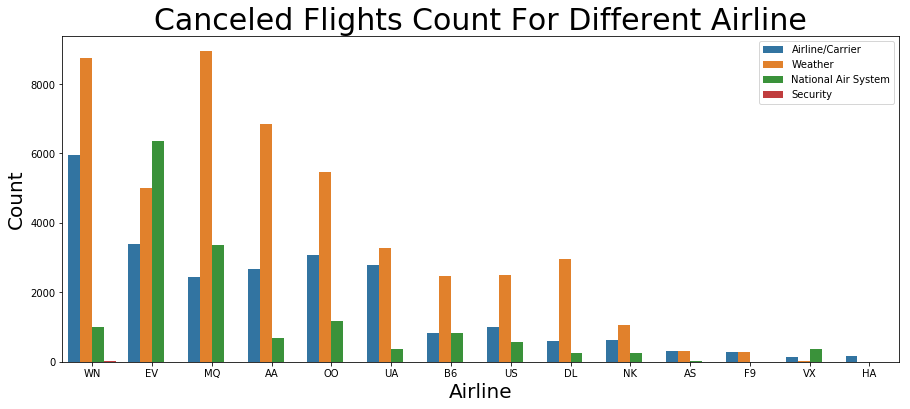

In [6]:
CANCELLED_FLIGHTS = flights[flights.CANCELLED==1]
AC = CANCELLED_FLIGHTS.AIRLINE.value_counts().reset_index()
AC.columns=['airline','count']
def decide_reason(x):
    if x == 'A':
        return 'Airline/Carrier'
    elif x =='B':
        return 'Weather'
    elif x=='C':
        return 'National Air System'
    else:
        return 'Security'
CANCELLED_FLIGHTS['Cancle Reason'] = flights['CANCELLATION_REASON'].apply(decide_reason)
fig = plt.figure(figsize=(15, 6))
ax = sns.countplot(data = CANCELLED_FLIGHTS, x = 'AIRLINE', hue='Cancle Reason', order=AC.airline)
ax.set_title('Canceled Flights Count For Different Airline',size=30)
ax.set_ylabel('Count',size=20)
ax.set_xlabel('Airline',size=20)
plt.legend(loc=1)
plt.show()

### 1.4 Different Delays Correlation 

I notice there are different kinds od delay. So, what are the relationship between them? I plot a heatmap to get some insights.

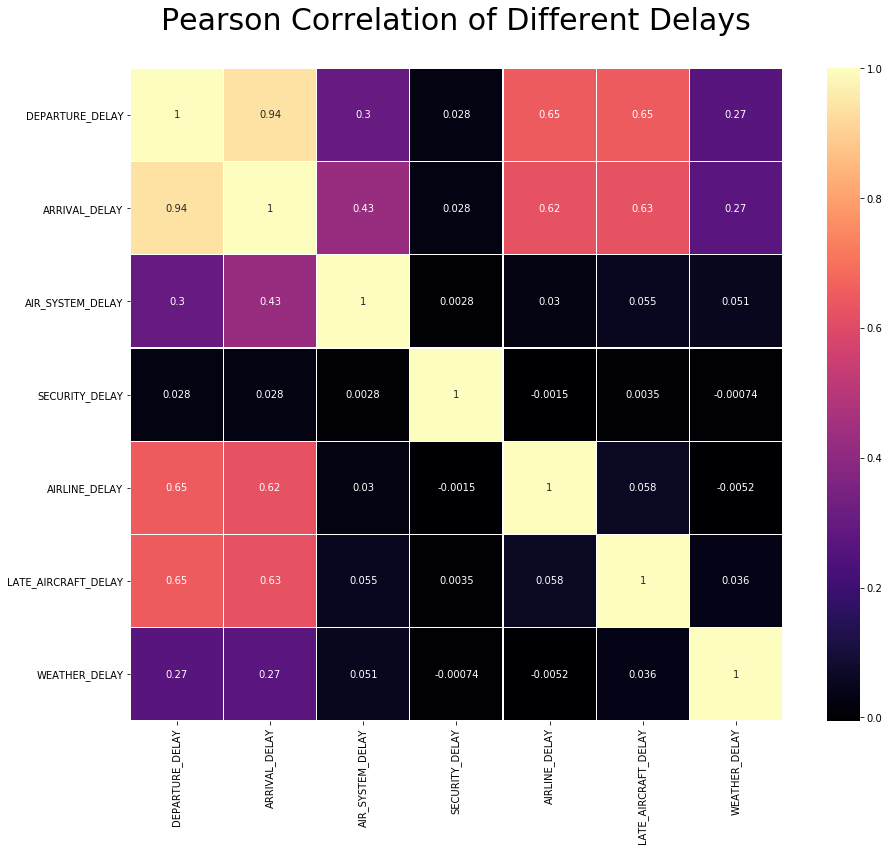

In [7]:
flights = flights[flights.CANCELLED==0]
flights = flights.fillna(0)
different_type_delay = flights[['DEPARTURE_DELAY', 'ARRIVAL_DELAY', 'AIR_SYSTEM_DELAY', 'SECURITY_DELAY' , 'AIRLINE_DELAY', 
                               'LATE_AIRCRAFT_DELAY', 'WEATHER_DELAY']]
colormap = plt.cm.magma
plt.figure(figsize=(16,12))
plt.title('Pearson Correlation of Different Delays', y=1.05, size=30)
sns.heatmap(different_type_delay.corr(),linewidths=0.1,vmax=1.0, square=True, 
            cmap=colormap, linecolor='white', annot=True)
plt.show()

### 1.5 Basic statistical description of airlines  

First, I consider all the flights from all carriers. Here, the aim is to classify the airlines with respect to their punctuality and for that purpose, I compute a few basic statisticial parameters:

In [8]:
def get_stats(group):
    return {'min': group.min(), 'max': group.max(),
            'count': group.count(), 'mean': group.mean()}

global_stats = flights['ARRIVAL_DELAY'].groupby(flights['AIRLINE']).apply(get_stats).unstack()
global_stats = global_stats.sort_values('count',ascending=False)
global_stats

,count,max,mean,min
AIRLINE,,,,
WN,1141618.0,659.0,4.823982,-73.0
DL,796522.0,1274.0,0.678809,-79.0
AA,638500.0,1971.0,3.923220,-87.0
OO,529826.0,1372.0,6.203848,-69.0
EV,511495.0,1223.0,6.939034,-64.0
UA,463384.0,1294.0,6.193917,-81.0
MQ,257898.0,1272.0,7.294752,-63.0
B6,240989.0,1002.0,6.929586,-76.0
US,194648.0,750.0,3.698117,-87.0


### 1.6 Delays heatmap 

Second, I consider all the flights from top rank carriers based on mean delays.Now, in order to facilitate the lecture of that information, I construct the heatmap between carriers and airport, trying to define if there is a correlation between the delays registered and the airport of origin

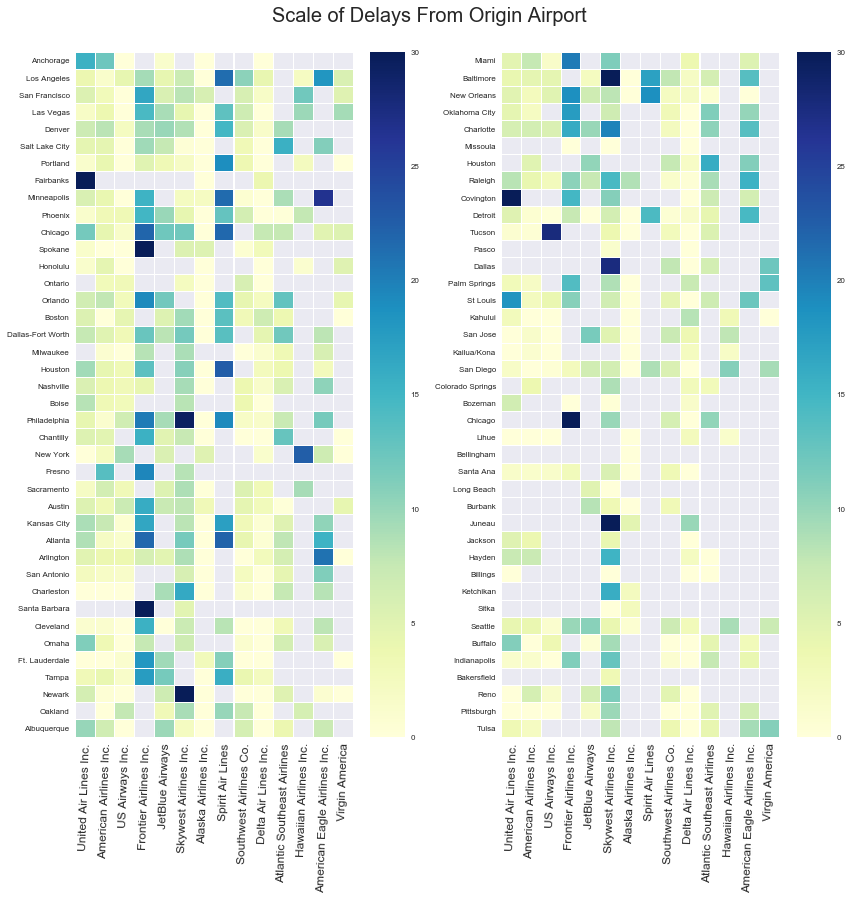

In [9]:
airport_mean_delays = pd.DataFrame(pd.Series(flights['ORIGIN_AIRPORT'].unique()))
airport_mean_delays.set_index(0, drop = True, inplace = True)
identify_airport = airports.set_index('IATA_CODE')['CITY'].to_dict()
abbr_companies = airlines.set_index('IATA_CODE')['AIRLINE'].to_dict()
for carrier in abbr_companies.keys():
    fg1 = flights[flights['AIRLINE'] == carrier]
    test = fg1['ARRIVAL_DELAY'].groupby(flights['ORIGIN_AIRPORT']).apply(get_stats).unstack()
    airport_mean_delays[carrier] = test.loc[:, 'mean'] 
sns.set(context="paper")
fig = plt.figure(1, figsize=(12,12))

ax = fig.add_subplot(1,2,1)
subset = airport_mean_delays.iloc[:40,:].rename(columns = abbr_companies)
subset = subset.rename(index = identify_airport)
mask = subset.isnull()
sns.heatmap(subset, linewidths=0.05, cmap="YlGnBu", mask=mask, vmin = 0, vmax = 30)
plt.setp(ax.get_xticklabels(), fontsize=12, rotation = 88) ;
ax.yaxis.label.set_visible(False)

ax = fig.add_subplot(1,2,2)    
subset = airport_mean_delays.iloc[40:80,:].rename(columns = abbr_companies)
subset = subset.rename(index = identify_airport)
fig.text(0.5, 1.02, "Scale of Delays From Origin Airport", ha='center', fontsize = 20)
mask = subset.isnull()
sns.heatmap(subset, linewidths=0.05, cmap="YlGnBu", mask=mask, vmin = 0, vmax = 30)
plt.setp(ax.get_xticklabels(), fontsize=12, rotation = 88) ;
ax.yaxis.label.set_visible(False)

plt.tight_layout()

### 1.7 Delays distribution

We need exact delay distribution for different airlines to rank them. This stripipplot gives us more information.

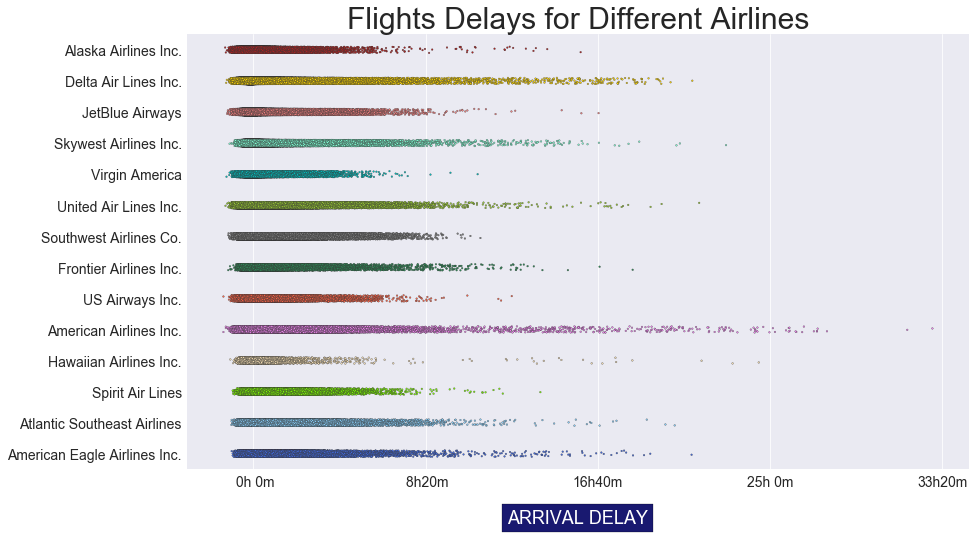

In [10]:
df2 = flights.loc[:, ['AIRLINE', 'ARRIVAL_DELAY']]
df2['AIRLINE'] = df2['AIRLINE'].replace(abbr_companies)
fig = plt.figure(figsize=(14, 8))
colors = ['firebrick', 'gold', 'lightcoral', 'aquamarine', 'c', 'yellowgreen', 'grey',
          'seagreen', 'tomato', 'violet', 'wheat', 'chartreuse', 'lightskyblue', 'royalblue']
ax = sns.stripplot(y="AIRLINE", x="ARRIVAL_DELAY", size = 1.7, palette = colors,
                    data=df2, linewidth = 0.3,  jitter=True)
plt.setp(ax.get_xticklabels(), fontsize=14)
plt.setp(ax.get_yticklabels(), fontsize=14)
ax.set_xticklabels(['{:2.0f}h{:2.0f}m'.format(*[int(y) for y in divmod(x,60)])
                         for x in ax.get_xticks()])
plt.xlabel('ARRIVAL DELAY', fontsize=18, bbox={'facecolor':'midnightblue', 'pad':5},
           color='w', labelpad=20)
ax.yaxis.label.set_visible(False)
ax.set_title('Flights Delays for Different Airlines',size=30)

plt.show()
del df2 , abbr_companies

___
## 2. Delay Classification
___
### 2.1 Divide Delay Type

It is really hard to predict the dalay when you do not know the exact information, So I change it into a classification problem, which I need to divide dalays in different types. Based on my own experience, I make a decision that the delays which exceed 30 minutes are "Seriously Delay". Now, Let's see the delays after divided.

In [11]:
flights['DELAY_LEVEL'] = flights['ARRIVAL_DELAY'].apply(lambda x:(0,1)[x > 30])
zero_list = []
one_list = []
for col in list(flights['AIRLINE'].unique()):
    zero_list.append(flights[flights['AIRLINE']==col].groupby('DELAY_LEVEL').count()['YEAR'][0])
    one_list.append(flights[flights['AIRLINE']==col].groupby('DELAY_LEVEL').count()['YEAR'][1])
trace1 = go.Bar(
    x=list(flights['AIRLINE'].unique()),
    y=zero_list ,
    name='Not Seriously Delay'
)
trace2 = go.Bar(
    x=list(flights['AIRLINE'].unique()),
    y=one_list,
    name='Seriously Delay'
)

data = [trace1, trace2]
layout = go.Layout(
    barmode='stack',
    title='Count of flights Based on Delay Type',
    titlefont={"size": 36}
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig)

### 2.2 Speed Analysis

Is a flight Seriously delay since it is slower? This violin plot shows the relationship between them. 

Here, I used this euqation: v = s/t , where v=speed, s=distance and t=time

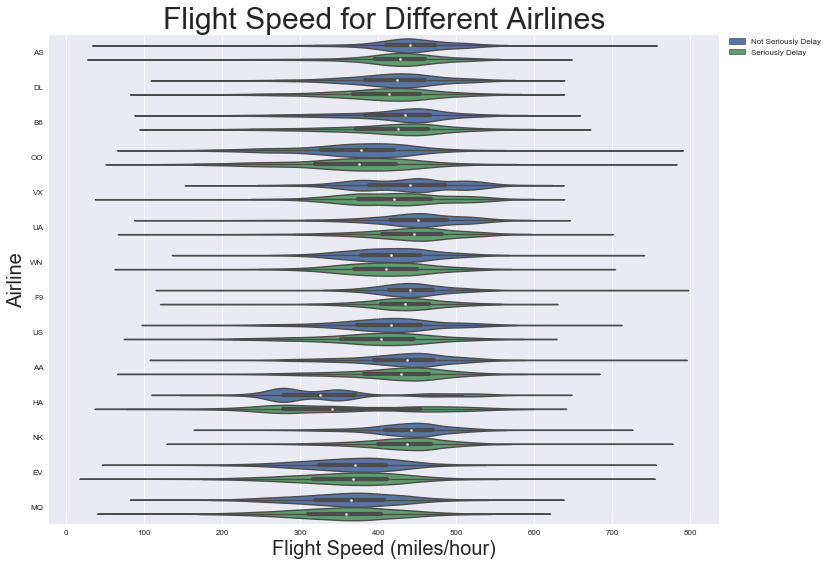

In [12]:
flights['FLIGHT_SPEED'] = 60*flights['DISTANCE']/flights['AIR_TIME']
flights['DELAY_LEVEL_NAME'] = flights['DELAY_LEVEL'].apply(lambda x:('Not Seriously Delay','Seriously Delay')[x == 1])
fig= plt.figure(figsize=(12,9))
ax = sns.violinplot(data=flights[flights['FLIGHT_SPEED']<100000], y='AIRLINE',x='FLIGHT_SPEED',hue='DELAY_LEVEL_NAME')
ax.set_title('Flight Speed for Different Airlines',size=30)
ax.set_ylabel('Airline',size=20)
ax.set_xlabel('Flight Speed (miles/hour)',size=20)
plt.setp(ax.get_legend().get_texts(), fontsize='20')
plt.legend(bbox_to_anchor=(1.01, 1), loc=2, borderaxespad=0.)
plt.show()

### 2.3 Build and train model

First, I need to choose the right data from the origin dataset, since many of them indicates the answer. For example, the AIR_TIME represent the whole flying time, which you can get the delays by substraction. So, I choose the data which you can know before this flight take off, such as origin airport and airlines. Then I choose the suitable paramters to build the LightGBM model to fir the training data.

In [13]:
target = flights['DELAY_LEVEL'].values
feature_columns=['MONTH', 'DAY', 'DAY_OF_WEEK', 'AIRLINE', 'FLIGHT_NUMBER',
                'TAIL_NUMBER', 'ORIGIN_AIRPORT', 'DESTINATION_AIRPORT',
                'SCHEDULED_DEPARTURE', 'SCHEDULED_TIME', 'DISTANCE',
                'SCHEDULED_ARRIVAL','ORIGIN_CITY','ORIGIN_STATE', 'DESTINATION_CITY',
                 'DESTINATION_STATE','AIR_SYSTEM_DELAY', 'SECURITY_DELAY', 'WEATHER_DELAY']
flights_feature = flights[feature_columns]
def encoder(col_name):
    le = LabelEncoder()
    return le.fit_transform(flights_feature[col_name].astype(str).values)
cat_col = [col for col in flights_feature.columns if not str(flights_feature[col][0]).isnumeric()]
for col in cat_col:
    flights_feature[col] = encoder(col)
flights_feature = flights_feature.astype(int)
Xt, Xv, yt, yv = train_test_split(flights_feature, target, test_size=0.2, random_state=42)
params = {
    "max_bin": 512,
    "learning_rate": 0.05,
    "boosting_type": "gbdt",
    "objective": "binary",
    "metric": "binary_logloss",
    "num_leaves": 10,
    "verbose": -1,
    "min_data": 100,
    "boost_from_average": True
}
evals_result = {} 
d_train = lgb.Dataset(Xt, label=yt)
d_valid = lgb.Dataset(Xv, label=yv)
model = lgb.train(params, d_train, 1000, valid_sets=[d_valid], 
                  early_stopping_rounds=50, verbose_eval=200,evals_result=evals_result)

Training until validation scores don't improve for 50 rounds.
[200]	valid_0's binary_logloss: 0.243906
[400]	valid_0's binary_logloss: 0.23995
[600]	valid_0's binary_logloss: 0.237764
[800]	valid_0's binary_logloss: 0.236358
[1000]	valid_0's binary_logloss: 0.235221


### 2.4 Evaluation the model

Evaluate the performance of the classification model according the test set. 


In [14]:
y_pred = model.predict(Xv)
y_pred = (y_pred>0.5)
print(classification_report(yv, y_pred))

             precision    recall  f1-score   support

          0       0.93      0.98      0.96    928656
          1       0.77      0.42      0.54    120441

avg / total       0.91      0.92      0.91   1049097



### 2.5 Factor Analysis

Let's see the influence of different factors.

Plot feature importances...


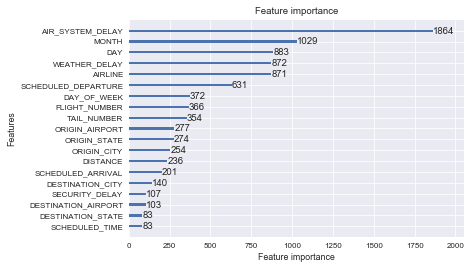

In [15]:
print('Plot feature importances...')
ax = lgb.plot_importance(model)
plt.show()

___
## 3. Twitter Sentiment Analysis
___
### 3.1 Sentiment distribution

It is needed to know the distribution of different sentiment for different airlines

In [16]:
positive_list = []
negative_list = []
neutral_list = []
for col in list(tweet['airline'].unique()):
    positive_list.append(tweet[tweet['airline']==col].groupby('airline_sentiment').count()['tweet_id'].positive)
    negative_list.append(tweet[tweet['airline']==col].groupby('airline_sentiment').count()['tweet_id'].negative)
    neutral_list.append(tweet[tweet['airline']==col].groupby('airline_sentiment').count()['tweet_id'].neutral)
trace1 = go.Bar(
    x=list(tweet['airline'].unique()),
    y=positive_list ,
    name='Positive Sentiment'
)
trace2 = go.Bar(
    x=list(tweet['airline'].unique()),
    y=negative_list,
    name='Negative Sentiment'
)
trace3 = go.Bar(
    x=list(tweet['airline'].unique()),
    y=neutral_list,
    name='Neutral Sentiment'
)

data = [trace1, trace2, trace3]
layout = go.Layout(
    barmode='stack',
    title='Customer sentiment for different airlines',
    titlefont={"size": 36}
)
fig = go.Figure(data=data, layout=layout)
py.iplot(fig)

### 3.2 Word Cloud for Positive Sentiment

I am curious about what people say when they have positive sentiment

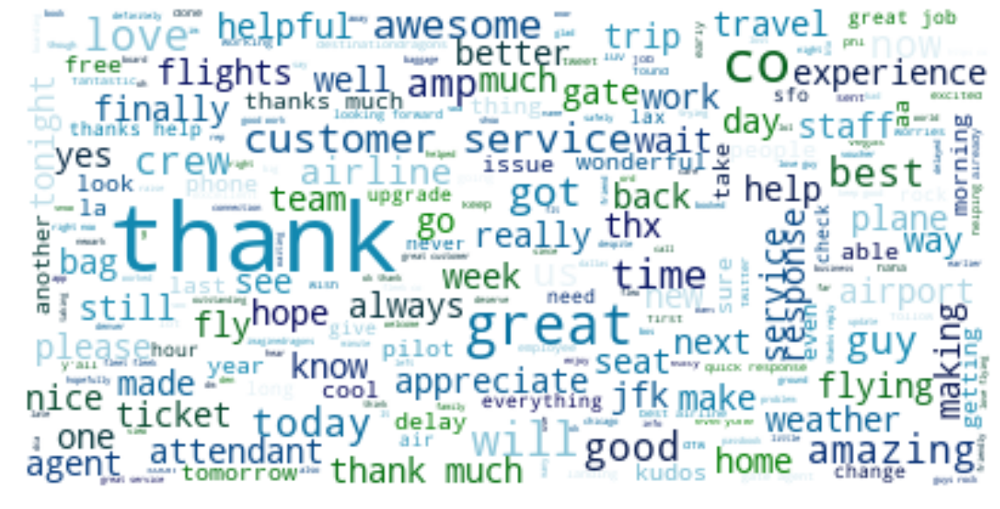

In [17]:
X = tweet['text']
y = tweet['airline_sentiment']
negative = y == 'negative'
positive = y == 'positive'
neutral = y == 'neutral'
stopwords = set(STOPWORDS)
def create_wordcloud(subset):
    plt.figure(figsize=(20,15))
    wc = WordCloud(background_color="white", max_words=2000, 
                   stopwords=stopwords, max_font_size= 40)
    wc.generate(" ".join(tweet[subset]['text'].str.lower()))
    plt.imshow(wc.recolor(colormap='ocean', random_state=37), alpha=0.98, interpolation="bilinear")
    plt.axis('off');
    
stopwords.update(['flight','delta','jetblue','americanair','usairway','southwestair','usairways',
                  'united','virginamerica','southwest'])
create_wordcloud(positive)

### 3.3 Word Cloud for Negative Sentiment

Now, Let's see the common word about negative sentiment

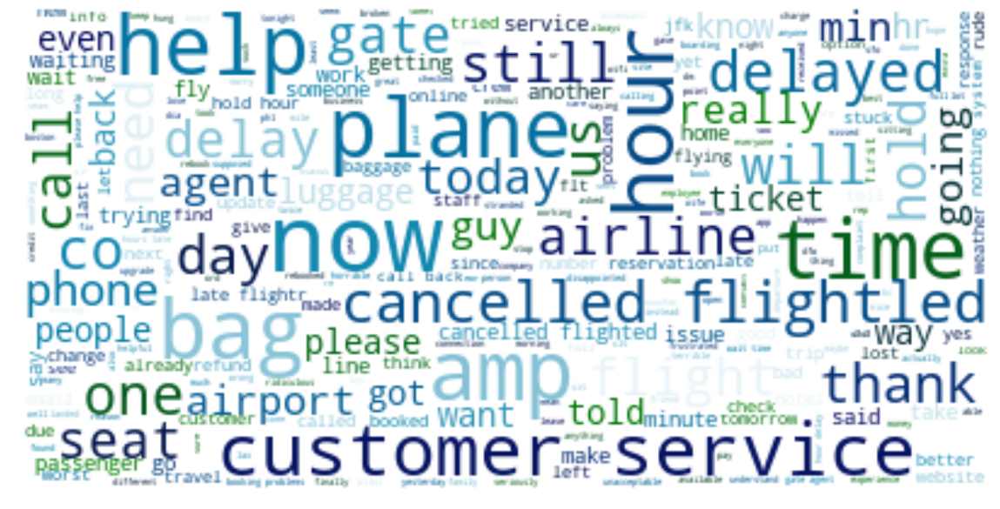

In [18]:
create_wordcloud(negative)

### 3.4 Word Cloud for Neutral Sentiment

What will people say if they have neutral sentiment?

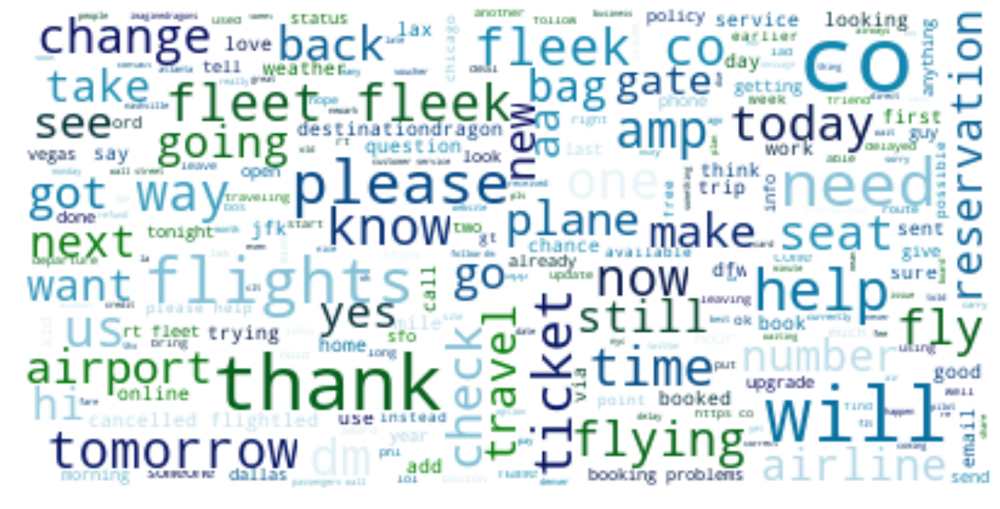

In [19]:
create_wordcloud(neutral)

### 3.5 Build and Train RNN Model

I take the text as the main input while take other factor as axillary input to construct the model

In [20]:
tweet['Created_Month'] = tweet['tweet_created'].apply(lambda x: x.month)
tweet['Created_Day'] = tweet['tweet_created'].apply(lambda x: x.day)
tweet = tweet.drop(['tweet_id','airline_sentiment_gold','negativereason_gold','tweet_coord','name','tweet_created'],axis=1)
def handle_missing(dataset):
    dataset.negativereason.fillna(value="None", inplace=True)
    dataset.negativereason_confidence.fillna(value=0, inplace=True)
    dataset.tweet_location.fillna(value="missing", inplace=True)
    dataset.user_timezone.fillna(value="missing", inplace=True)
    return (dataset)
tweet = handle_missing(tweet)
def tweet_encoder(col_name):
    le = LabelEncoder()
    return le.fit_transform(tweet[col_name])
cat_columns = ['airline_sentiment', 'negativereason',
               'airline','tweet_location', 'user_timezone']
for col in cat_columns:
    tweet[col] = tweet_encoder(col)
tok_raw = Tokenizer()
tok_raw.fit_on_texts(tweet['text'])
tweet["text"] = tok_raw.texts_to_sequences(tweet.text.str.lower())
dtrain, dvalid = train_test_split(tweet, random_state=123, train_size=0.8)
dtrain_target = pd.get_dummies(dtrain.airline_sentiment).values
dvalid_target = pd.get_dummies(dvalid.airline_sentiment).values
def get_keras_data(dataset):
    X = {
        'text': pad_sequences(dataset.text, maxlen=36),
        'airline_sentiment_confidence': np.array(dataset.airline_sentiment_confidence),
        'negativereason' : np.array(dataset.negativereason),
         'negativereason_confidence' : np.array(dataset.negativereason_confidence),
         'airline' : np.array(dataset.airline),
         'retweet_count' : np.array(dataset.retweet_count),
         'tweet_location' : np.array(dataset.tweet_location),
        'user_timezone' : np.array(dataset.user_timezone),
        'Created_Month' : np.array(dataset.Created_Month),
        'Created_Day' : np.array(dataset.Created_Day),
    }
    return X
X_train = get_keras_data(dtrain)
X_valid = get_keras_data(dvalid)
MAX_TEXT = np.max([np.max(tweet.text.max())])+80
MAX_NEGATIVEREASON = np.max([tweet.negativereason.max()])+1
MAX_AIRLINE = np.max([tweet.airline.max()])+1
MAX_LOCATION = np.max([tweet.tweet_location.max()])+1
MAX_TIMEZONE = np.max([tweet.user_timezone.max()])+1
def get_model():
    dr_r = 0.5
    
    text = Input(shape=[X_train["text"].shape[1]], name="text")
    airline_sentiment_confidence = Input(shape=[1], name="airline_sentiment_confidence")
    negativereason = Input(shape=[1], name="negativereason")
    negativereason_confidence = Input(shape=[1], name="negativereason_confidence")
    airline = Input(shape=[1], name="airline")
    retweet_count = Input(shape=[1], name="retweet_count")
    tweet_location = Input(shape=[1], name="tweet_location")
    user_timezone = Input(shape=[1], name="user_timezone")
    Created_Month = Input(shape=[1], name="Created_Month")
    Created_Day = Input(shape=[1], name="Created_Day")
    
    emb_text = Embedding(MAX_TEXT, 50)(text)
    emb_negativereason = Embedding(MAX_NEGATIVEREASON, 10)(negativereason)
    emb_airline = Embedding(MAX_AIRLINE, 10)(airline)
    emb_tweet_location = Embedding(MAX_LOCATION, 10)(tweet_location)
    emb_user_timezone = Embedding(MAX_TIMEZONE, 10)(user_timezone)

    rnn_layer = GRU(128) (emb_text)
    
    main_l = concatenate([
        Flatten() (emb_negativereason)
        , Flatten() (emb_airline)
        , Flatten() (emb_tweet_location)
        , Flatten() (emb_user_timezone)
        , rnn_layer
        , Created_Day
        , Created_Month
        , retweet_count
        , negativereason_confidence
        , airline_sentiment_confidence
    ])
    main_l = BatchNormalization() (Dropout(dr_r) (Dense(64) (main_l)))
    main_l = BatchNormalization() (Dropout(dr_r) (Dense(64) (main_l)))
    main_l = BatchNormalization() (Dropout(dr_r) (Dense(64) (main_l)))

    output = Dense(3, activation="softmax") (main_l)
    
    model = Model([text, airline_sentiment_confidence, negativereason, negativereason_confidence,
    airline, retweet_count, tweet_location, user_timezone, Created_Month, Created_Day], output)
    model.compile('sgd', 'categorical_crossentropy', metrics=['accuracy'])
    return model    
model = get_model()

BATCH_SIZE = 8
epochs = 6

model = get_model()
model.fit(X_train, dtrain_target, epochs=epochs, batch_size=BATCH_SIZE
          , validation_data=(X_valid, dvalid_target)
          , verbose=1)

Train on 11712 samples, validate on 2928 samples
Epoch 1/6
11712/11712 [==============================] - 33s 3ms/step - loss: 1.0002 - acc: 0.5701 - val_loss: 0.8910 - val_acc: 0.6281
Epoch 2/6
11712/11712 [==============================] - 30s 3ms/step - loss: 0.8876 - acc: 0.6249 - val_loss: 0.8150 - val_acc: 0.6281
Epoch 3/6
11712/11712 [==============================] - 30s 3ms/step - loss: 0.6789 - acc: 0.6942 - val_loss: 0.3423 - val_acc: 0.8460
Epoch 4/6
11712/11712 [==============================] - 30s 3ms/step - loss: 0.4848 - acc: 0.7625 - val_loss: 0.2736 - val_acc: 0.8460
Epoch 5/6
11712/11712 [==============================] - 29s 3ms/step - loss: 0.4063 - acc: 0.7870 - val_loss: 0.2589 - val_acc: 0.8460
Epoch 6/6
11712/11712 [==============================] - 30s 3ms/step - loss: 0.4019 - acc: 0.7911 - val_loss: 0.2555 - val_acc: 0.8460


## Conclusion

These notebook was three-fold. The first part dealt with an exploration of the dataset, with the aim of understanding some properties of the delays registered by flights, airlines and airports. This exploration gave me the occasion of using various vizualization tools offered by python. The second part of the notebook consisted in the elaboration of a model aimed at classifiering flight delays type. For that purpose, I used lightGBM and showed the importance of different factors. In fact, I think we could give good advice for those people who do not like delays based on the result. The third part deal with Twitter tweets and the RNN model perform really well, which means that there must be some pattern in customer tweets. Maybe we can improve the flight service based on the analysis.